# Import and settings

In [1]:
from honeybee_comb_inferer.inference import HoneyBeeCombInferer
import sysconfig
import os
import numpy as np
from glob import glob
import matplotlib.pyplot as plt
import gc
import torch
import cv2

possible_models = ["unet_effnetb0", "deeplabv3_resnet18","unet_resnet18", "unet_resnet34"]

model_name = "unet_effnetb0"
# model_name = possible_models[3]
data_path = sysconfig.get_path('data')
path_to_pretrained_models = os.path.join(data_path, "models")
# path_to_pretrained_models = '/Users/jacob/Library/CloudStorage/Dropbox/Bayer-Bees/Student-Projects/comb identification/honeybee-comb-segmentation-models'
print(path_to_pretrained_models)
device = "cuda"

# model = HoneyBeeCombInferer(model_name = model_name, path_to_pretrained_models = path_to_pretrained_models, device = device)

2025-03-21 07:48:45.350848: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-21 07:48:45.440106: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-21 07:48:45.459192: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-21 07:48:45.463094: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-21 07:48:45.517624: I tensorflow/core/platform/cpu_feature_guar

/home/beesbook/miniconda3/envs/beesbook/models


# Functions

In [ ]:
def apply_clahe_gray(img, clipLimit=2.0, tileGridSize=(8, 8)):
    """
    Apply CLAHE (Contrast Limited Adaptive Histogram Equalization) to a grayscale image.

    If the image is in float format (0-1), it is converted to uint8 (0-255) before processing.

    Parameters:
    - img: Input grayscale image (can be float [0-1] or uint8 [0-255])
    - clipLimit: Contrast limit for CLAHE
    - tileGridSize: Size of grid for CLAHE

    Returns:
    - CLAHE-enhanced grayscale image (uint8)
    """

    # Convert float (0-1) to uint8 (0-255)
    if img.dtype in [np.float32, np.float64]:
        img = (img * 255).clip(0, 255).astype(np.uint8)  # Scale & convert

    clahe = cv2.createCLAHE(clipLimit=clipLimit, tileGridSize=tileGridSize)
    return clahe.apply(img)

# --- Function to apply CLAHE (for color images) ---
def apply_clahe_color(img, clipLimit=2.0, tileGridSize=(8, 8)):
    # Convert to LAB color space
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=clipLimit, tileGridSize=tileGridSize)
    cl = clahe.apply(l)
    limg = cv2.merge((cl, a, b))
    # Convert back to BGR color space
    return cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

# Single image

/home/beesbook/miniconda3/envs/beesbook/lib/python3.12/site-packages/honeybee_comb_inferer/model/HoneyBeeCombSegmentationModel.py:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feat

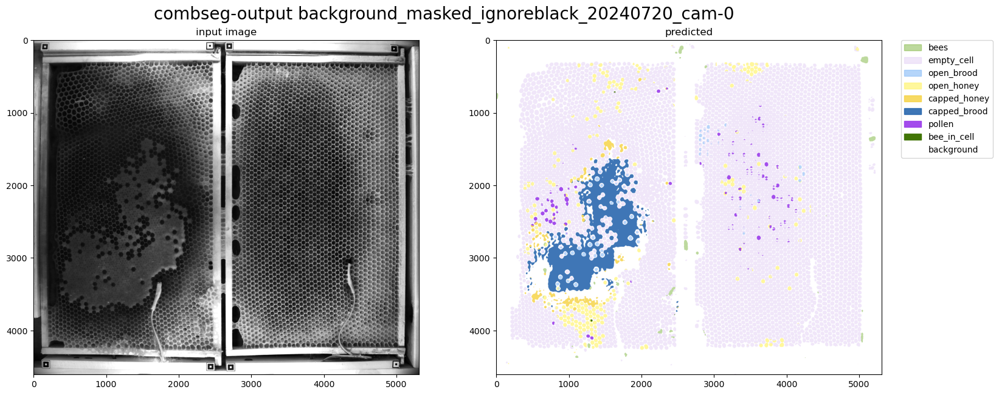

In [4]:
model_name = "unet_effnetb0"
model = HoneyBeeCombInferer(model_name = model_name, path_to_pretrained_models = path_to_pretrained_models, device = device)
filename = "combseg-output/background_masked_ignoreblack_20240720_cam-0.png"
# filename = 'image_output/test_bg_input.png'

# run inference and plot
pred = model.infer(image=filename)
f, ax = model.plot_prediction(pred, input_image=filename)
f.set_size_inches(18,13)
plt.suptitle(filename.split('/')[-2]+' '+os.path.basename(filename).split('.')[0],y=0.75,fontsize=20)
plt.show()

['combseg-output/background_masked_ignoreblack_20240621_cam-1.png', 'combseg-output/background_masked_ignoreblack_20240621_cam-3.png', 'combseg-output/background_masked_ignoreblack_20240720_cam-0.png', 'combseg-output/background_masked_ignoreblack_20240720_cam-2.png', 'combseg-output/background_masked_ignoreblack_20240725_cam-1.png']


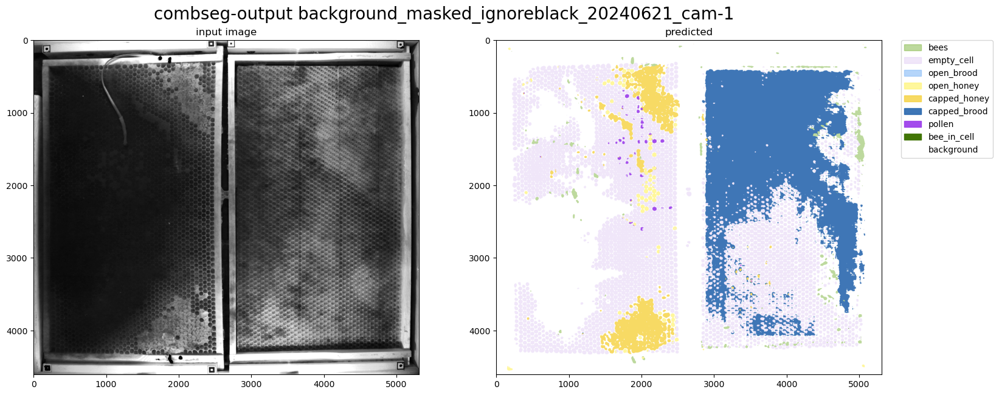

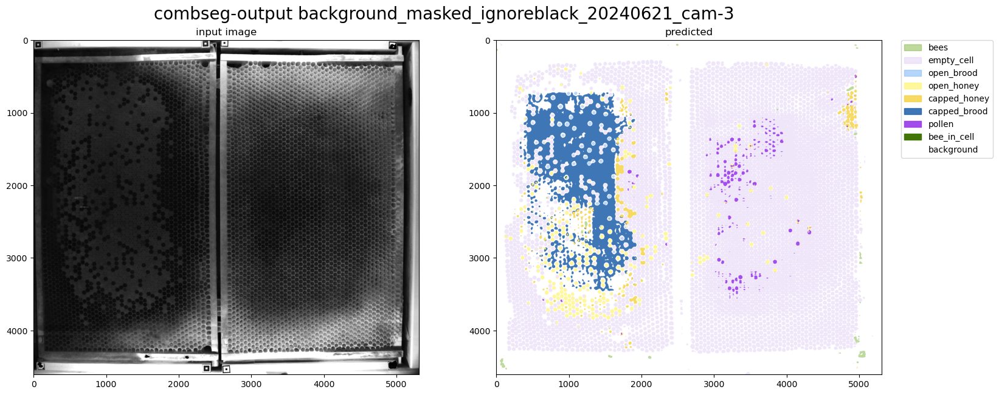

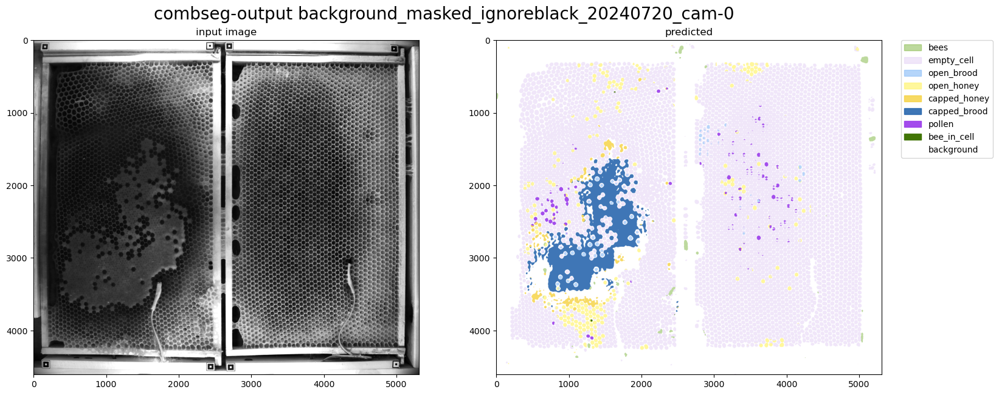

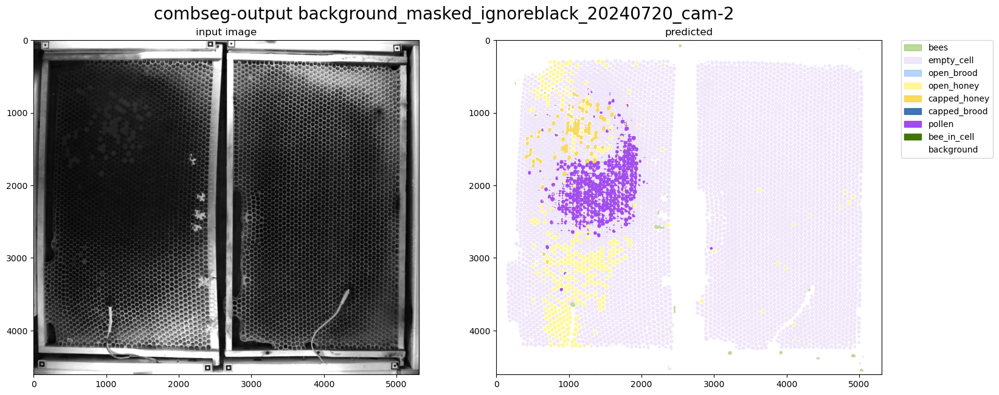

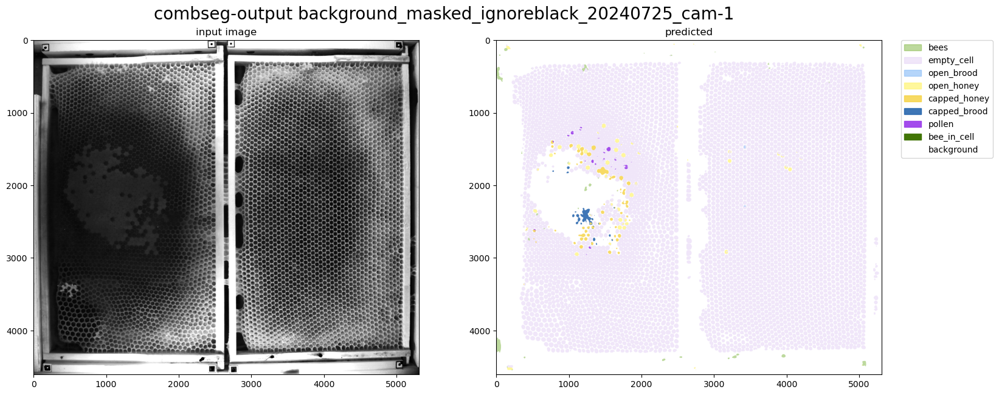

In [8]:
## to loop through files in a folder
imagedir = "combseg-output/"
filenames = sorted(glob(imagedir+"*ignoreblack_2024*png"))
print(filenames)
for filename in filenames:
    pred = model.infer(image=filename)
    f, ax = model.plot_prediction(pred, input_image=filename)
    f.set_size_inches(18,13)
    plt.suptitle(filename.split('/')[-2]+' '+os.path.basename(filename).split('.')[0],y=0.75,fontsize=20)
    plt.show()

# Sequence of images to infer without bees

In [3]:
model_name = "unet_effnetb0"
model = HoneyBeeCombInferer(model_name = model_name, path_to_pretrained_models = path_to_pretrained_models, device = device)
model.config['dataloader']['batch_size'] = 2
model.config['dataloader']['num_workers'] = 8

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [01:46<00:00,  9.66s/it]


CPU times: user 1min 37s, sys: 58.8 s, total: 2min 36s
Wall time: 1min 48s


(<Figure size 2800x2000 with 1 Axes>, <Axes: title={'center': 'predicted'}>)

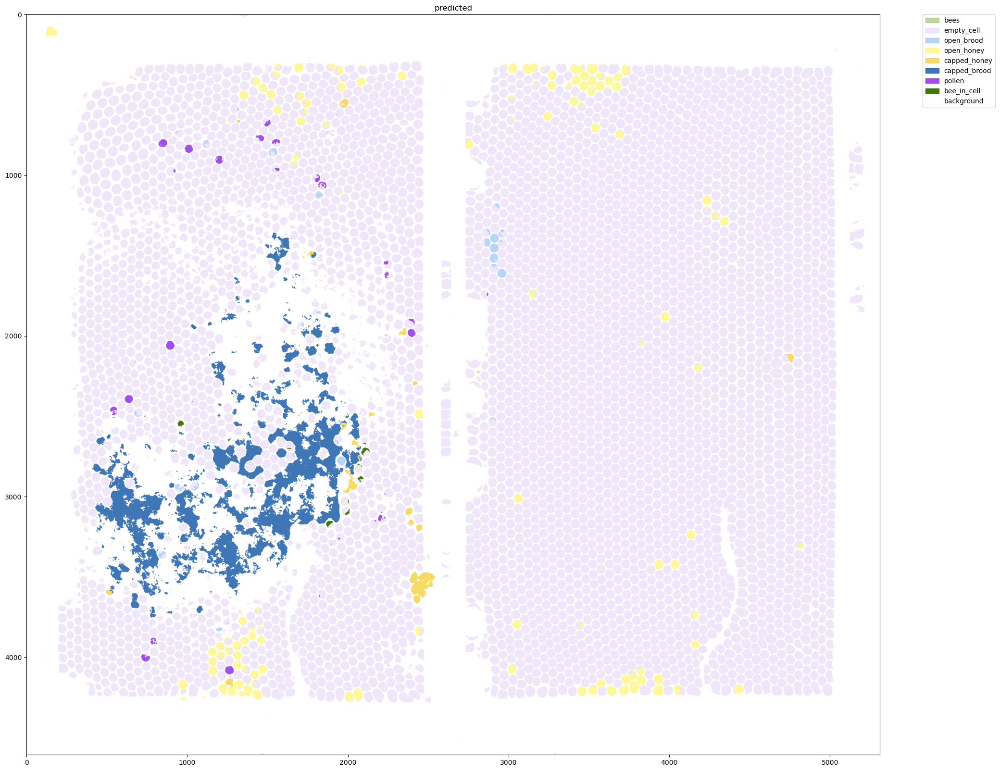

In [4]:
%%time
# for inferring mask without bees
path_to_frames = "/home/beesbook/mnt/scratch/beesbook2024/extracted_frames/20240720/cam-0/"
path_to_frames = "/home/beesbook/tmp/original"

pred_no_bees = model.infer_without_bees_opt(path_to_frames,skip=1)
model.plot_prediction(pred_no_bees)

# Sequence of images:  loop

In [ ]:
# ----------------------------
# Configuration
# ----------------------------
base_folder = "/home/beesbook/mnt/scratch/beesbook2024/extracted_frames/"
# List of relative date/camera folders
datecam_folders = [
    "20240720/cam-0",
    "20240725/cam-1",
    "20240621/cam-1",
    "20240720/cam-2",
    "20240621/cam-3"
]

# Directory to save final predictions
savedir = "/home/beesbook/jacob/2024analysis/combseg-output/"
os.makedirs(savedir, exist_ok=True)

# Model parameters
possible_models = ["unet_effnetb0", "deeplabv3_resnet18", "unet_resnet18", "unet_resnet34"]
# Update with your pretrained models path (or use sysconfig as needed)
device = "cuda"  # or "cuda" if available

skip_val = 25  # skip parameter for inference

# ----------------------------
# Loop over each model and each date/cam folder
# ----------------------------
for model_name in possible_models:
    print(f"\nProcessing with model: {model_name}")
    # Initialize model instance for current model
    model = HoneyBeeCombInferer(model_name=model_name,
                                path_to_pretrained_models=path_to_pretrained_models,
                                device=device)
    model.config['dataloader']['batch_size'] = 2
    model.config['dataloader']['num_workers'] = 8

    for folder in datecam_folders[2:3]:
        # folder is like "20240720/cam-0"
        date, cam = folder.split("/")
        path_to_frames = os.path.join(base_folder, folder)

        print(f"  Processing: Date = {date}, Camera = {cam}")
        try:
            # Run inference on the folder, skipping every 200 batches
            pred_no_bees = model.infer_without_bees_opt(path_to_frames, skip=skip_val)
        except Exception as e:
            print(f"  Error processing {folder}: {e}")
            continue

        # Construct save name: modelName_date_cam.npz
        save_name = os.path.join(savedir, f"{model_name}_{date}_{cam}.npz")
        np.savez_compressed(save_name, pred_no_bees=pred_no_bees)
        print(f"Saved NPZ file: {save_name}")

        # Optionally, plot the prediction
        model.plot_prediction(pred_no_bees)

    # After processing this model, free GPU memory:
    del model
    gc.collect()
    torch.cuda.empty_cache()

# View already created map

In [6]:
savedir = 'combseg-output//'
files = sorted(glob(savedir+"*20240621_cam-1*npz"))
[os.path.basename(f) for f in files]


['deeplabv3_resnet18_20240621_cam-1.npz',
 'unet_effnetb0_20240621_cam-1.npz',
 'unet_resnet18_20240621_cam-1.npz',
 'unet_resnet34_20240621_cam-1.npz']

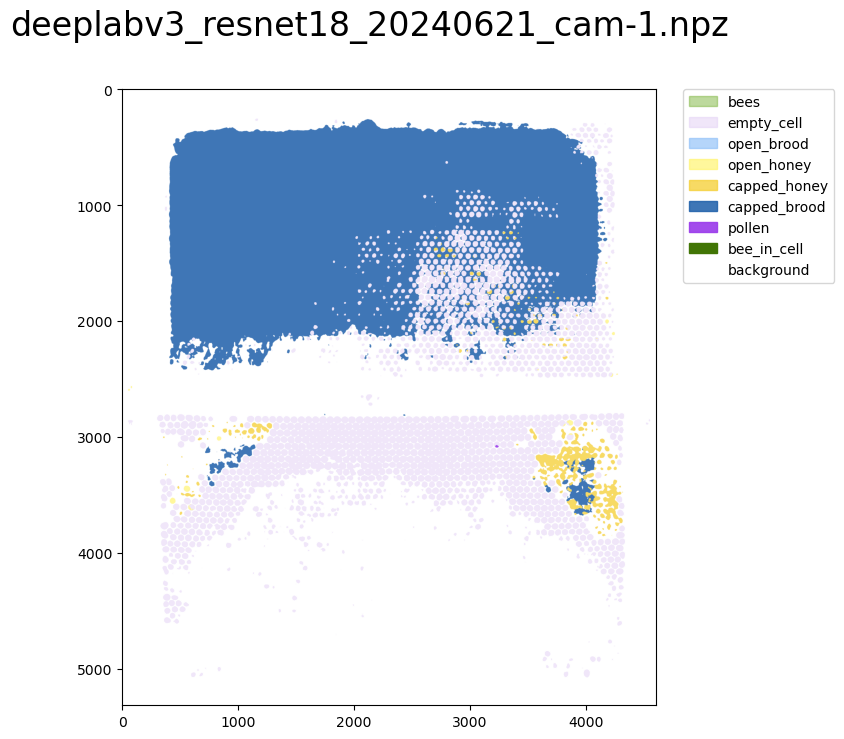

/home/beesbook/miniconda3/envs/beesbook/lib/python3.12/site-packages/honeybee_comb_inferer/model/HoneyBeeCombSegmentationModel.py:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feat

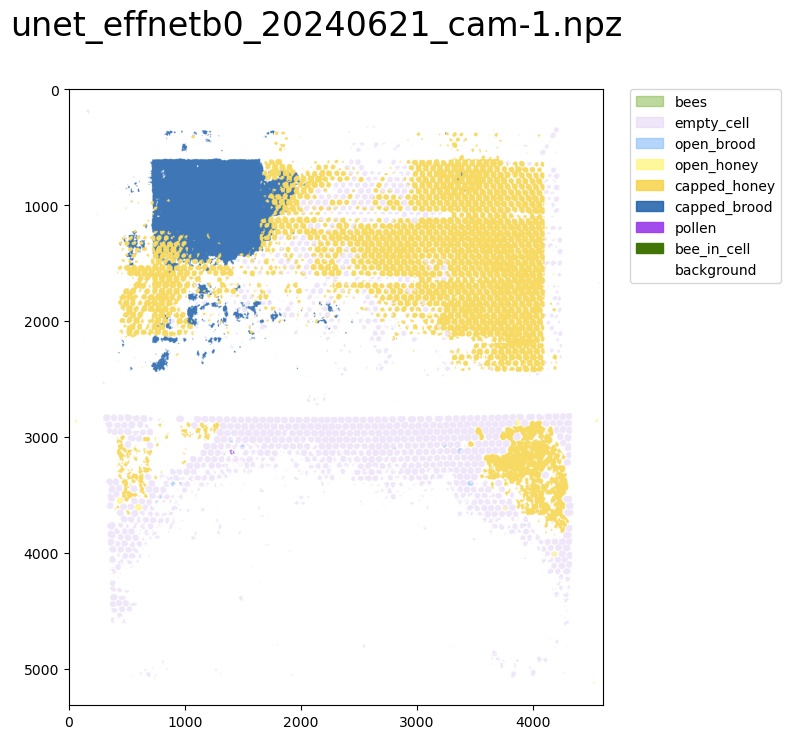

/home/beesbook/miniconda3/envs/beesbook/lib/python3.12/site-packages/honeybee_comb_inferer/model/HoneyBeeCombSegmentationModel.py:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feat

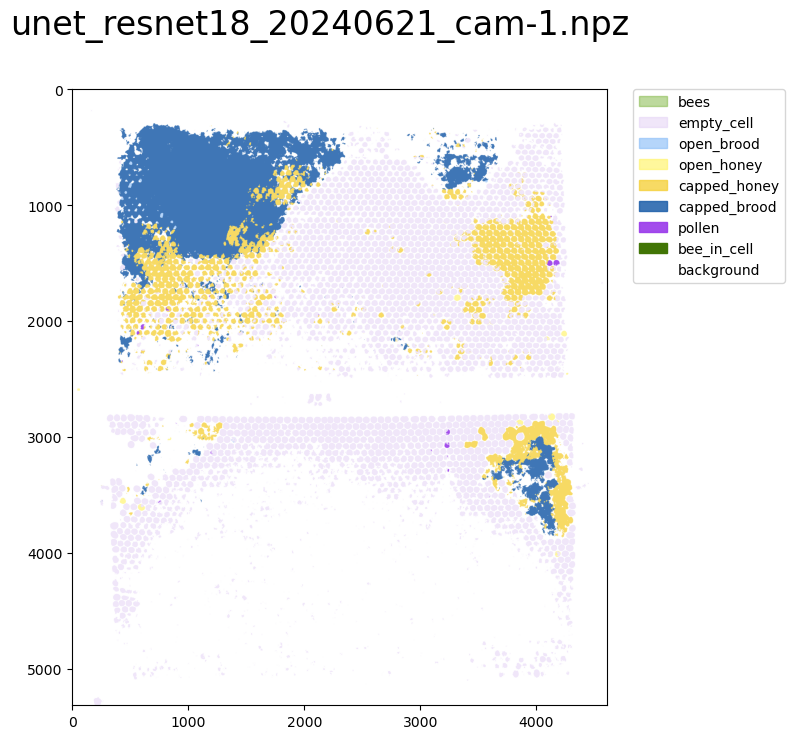

/home/beesbook/miniconda3/envs/beesbook/lib/python3.12/site-packages/honeybee_comb_inferer/model/HoneyBeeCombSegmentationModel.py:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feat

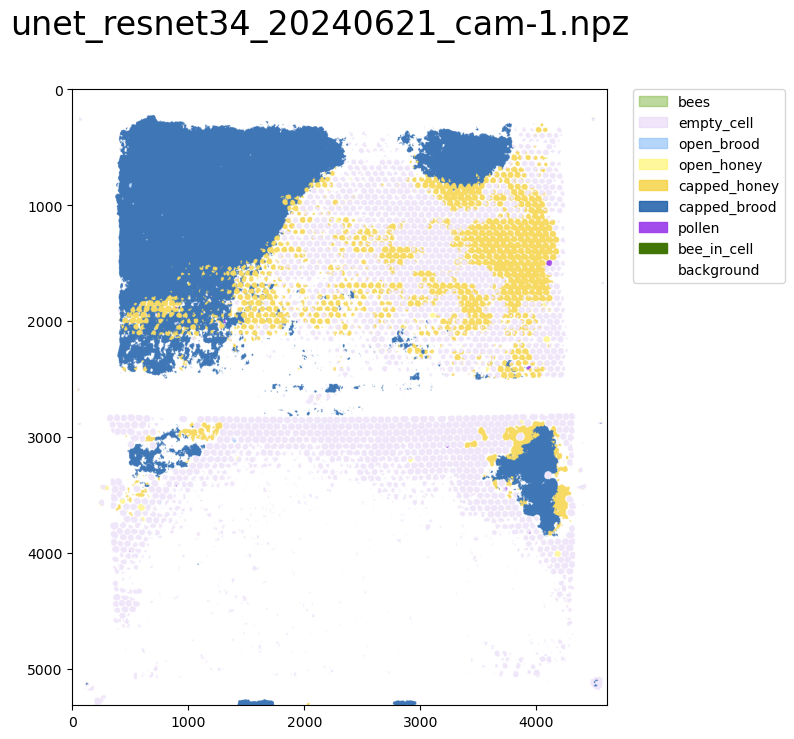

In [ ]:
file = files[0]
for file in files:
    model_name = '_'.join(os.path.basename(file).split('_')[0:2])
    data = np.load(file)
    pred_no_bees = data["pred_no_bees"]

    model = HoneyBeeCombInferer(model_name=model_name,
                                path_to_pretrained_models=path_to_pretrained_models,
                                device=device)

    # Process the labels and rotate the image 90° counterclockwise
    label_processed = model.get_processed_labels(pred_no_bees)
    rotated = np.rot90(label_processed, k=1)

    # Create a figure and plot the rotated image
    fig, ax = plt.subplots(1, 1, figsize=(16, 8))
    ax.imshow(rotated)
    ax.legend(handles=model.patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
    plt.suptitle(os.path.basename(file), fontsize=24)
    plt.show()

    # Save the figure as a PDF in the same folder with the same filename but a .pdf extension
    base, _ = os.path.splitext(file)
    fig.savefig(base + ".pdf", format="pdf", bbox_inches="tight")

# Counting of individual cells

In [ ]:
from honeybee_comb_inferer.cell_counter import CellCounter

In [ ]:
cell_counter = CellCounter(inferred_mask=pred_no_bees, method = "edt")

In [ ]:
# Euclidean Distance Transform
cell_counter.run_counter()

Time taken:  7.439 sec.
Total number of cells: 4875


{'empty_cell': 4828, 'open_honey': 25, 'capped_honey': 7, 'pollen': 15}

In [ ]:
# Circle Hough Transform
cell_counter.method = "cht"
cell_counter.run_counter()

Time taken:  39.99 sec.
Total number of cells: 4739


{'empty_cell': 4700, 'open_honey': 18, 'capped_honey': 6, 'pollen': 15}

# Testing upscaling and histogram normalization

## Apply image operations and save files

In [ ]:
import shutil
# copy files to a temp folder, to run faster
basedir='/home/beesbook/mnt/scratch/beesbook2024/extracted_frames/20240720/cam-0/'
files = glob(basedir+"2024*png")
dest = '/home/beesbook/tmp/original/'
os.makedirs(dest,exist_ok=True)
for f in files[::50]:
    shutil.copy(f,dest+os.path.basename(f))

In [ ]:
# copy files to a temp folder, to run faster
basedir='/home/beesbook/mnt/scratch/beesbook2024/extracted_frames/20240725/cam-1/'
files = glob(basedir+"2024*png")
dest = '/home/beesbook/tmp2/original/'
os.makedirs(dest,exist_ok=True)
for f in files[::50]:
    shutil.copy(f,dest+os.path.basename(f))

## apply combseg to images in each folder

In [ ]:
# ----------------------------
# Configuration
# ----------------------------
base_folder = "/home/beesbook/tmp/"
# List of relative date/camera folders
subfolders = sorted(glob(base_folder+'upscale*'))

# Directory where plots will be saved
save_dir = "/home/beesbook/jacob/2024analysis/combseg-plots/"
os.makedirs(save_dir, exist_ok=True)

# Model parameters (adjust as needed)
model_name = "unet_effnetb0"

skip_val = 1  # Process every image

# ----------------------------
# Loop over each folder, run inference, plot, and save
# ----------------------------
for folder in subfolders:
    # Initialize the model (assumes this is done once)
    model = HoneyBeeCombInferer(model_name=model_name,
                                path_to_pretrained_models=path_to_pretrained_models,
                                device=device)
    model.config['dataloader']['batch_size'] = 2
    model.config['dataloader']['num_workers'] = 8
    print(f"Processing folder: {folder}")

    pred_no_bees = model.infer_without_bees_opt(folder, skip=skip_val)

    # Plot the prediction. Assume plot_prediction returns (fig, ax)
    fig, ax = model.plot_prediction(pred_no_bees)

    # Set the suptitle to the folder name
    fig.suptitle(folder, fontsize=24)
    # Build the output filename: replace "/" with "_" to form a valid filename
    filename = folder.replace("/", "_") + ".png"
    output_path = os.path.join(save_dir, filename)
    fig.savefig(output_path, bbox_inches="tight")
    print(f"Saved plot to: {output_path}")

    # Close the figure to free memory
    plt.close(fig)

    # After processing this model, free GPU memory:
    del model
    gc.collect()
    torch.cuda.empty_cache()

/home/beesbook/miniconda3/envs/beesbook/lib/python3.12/site-packages/honeybee_comb_inferer/model/HoneyBeeCombSegmentationModel.py:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feat

Processing folder: /home/beesbook/tmp/upscale_0_CLAHE


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [01:46<00:00,  9.69s/it]


Saved plot to: /home/beesbook/jacob/2024analysis/combseg-plots/_home_beesbook_tmp_upscale_0_CLAHE.png
Processing folder: /home/beesbook/tmp/upscale_0_noCLAHE


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [01:45<00:00,  9.60s/it]


Saved plot to: /home/beesbook/jacob/2024analysis/combseg-plots/_home_beesbook_tmp_upscale_0_noCLAHE.png
Processing folder: /home/beesbook/tmp/upscale_10_CLAHE


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [02:06<00:00, 11.54s/it]


Saved plot to: /home/beesbook/jacob/2024analysis/combseg-plots/_home_beesbook_tmp_upscale_10_CLAHE.png
Processing folder: /home/beesbook/tmp/upscale_10_noCLAHE


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [02:07<00:00, 11.55s/it]


Saved plot to: /home/beesbook/jacob/2024analysis/combseg-plots/_home_beesbook_tmp_upscale_10_noCLAHE.png
Processing folder: /home/beesbook/tmp/upscale_20_CLAHE


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [02:38<00:00, 14.38s/it]


Saved plot to: /home/beesbook/jacob/2024analysis/combseg-plots/_home_beesbook_tmp_upscale_20_CLAHE.png
Processing folder: /home/beesbook/tmp/upscale_20_noCLAHE


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [02:37<00:00, 14.30s/it]


Saved plot to: /home/beesbook/jacob/2024analysis/combseg-plots/_home_beesbook_tmp_upscale_20_noCLAHE.png
